Carga de datos

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Ruta de la carpeta "outputs"
ruta_outputs = Path(r"D:\Universidad\ULTIMO_SEMESTRE\Tesis\Proyecto_PasswordStrength_\outputs")

# Archivo dentro de esa carpeta
ruta_csv = ruta_outputs / "resultados_input_10000.csv"

df = pd.read_csv(ruta_csv)
df.head()


,password,masked,length,charset_size,shannon_bits_per_char,shannon_total_bits,combinatorial_bits,crack_online_throttled_comb,crack_online_throttled_shan,crack_offline_cpu_comb,...,feat___max_same_char_run,feat___date_at_end,feat___has_date6,feat__has_seq_num,feat__num_lower,feat___has_date8,feat___has_word_year2,feat___ends_inc_seq4,feat___has_long_repeats,feat___is_email_strict
0,would21,wo*****,7,36,2.807355,19.651484,36.189475,24.83 years,2.29 h,90.70 d,...,1,0,0,0,5,0,1,0,0,0
1,would2020,wo*******,9,36,2.725481,24.529325,46.529325,3.22e+04 years,2.80 d,321.82 years,...,1,0,0,0,5,0,0,0,0,0
2,luisaluisa,lu********,10,26,2.321928,23.219281,47.004397,4.47e+04 years,1.13 d,447.33 years,...,1,0,0,0,10,0,0,0,1,0
3,time78,ti****,6,36,2.584963,15.509775,31.019550,251.94 d,7.8 min,2.52 d,...,1,0,0,0,4,0,1,0,0,0
4,about123,ab******,8,36,3.000000,24.000000,41.359400,893.96 years,1.94 d,8.94 years,...,1,0,0,1,5,0,0,0,0,0


Separacion en secciones (3 Secciones de 3333 contraseñas: 0 No seguras/debiles, 1 Contraseñas con patrones, 2 Contraseñas Seguras)

In [29]:
n = len(df)          # 10000
third = n // 3       # 3333

# Creamos un SEGMENTO de origen, NO una etiqueta de clase del modelo
df['segmento_origen'] = 0
df.loc[third: third*2 - 1, 'segmento_origen'] = 1
df.loc[third*2: , 'segmento_origen'] = 2

df['segmento_origen'].value_counts().sort_index()



segmento_origen
0    3333
1    3333
2    3334
Name: count, dtype: int64

In [30]:
segment_map = {
    0: "primer_tercio",
    1: "segundo_tercio",
    2: "tercer_tercio"
}
df['segmento_label'] = df['segmento_origen'].map(segment_map)
df[['segmento_origen', 'segmento_label']].head()


,segmento_origen,segmento_label
0,0,primer_tercio
1,0,primer_tercio
2,0,primer_tercio
3,0,primer_tercio
4,0,primer_tercio


In [31]:
prob_cols = [
    'prob_secure_lightgbm',
    'prob_secure_xgboost',
    'prob_secure_logistic_l2'
]

low_thr = 0.2
high_thr = 0.8


In [32]:
results = {}

for c in [0, 1, 2]:
    subset = df[df['segmento_origen'] == c]
    summary = {'count': len(subset)}
    
    for model in prob_cols:
        probs = subset[model]
        summary[f'{model}_mean'] = probs.mean()
        summary[f'{model}_low_%'] = (probs < low_thr).mean() * 100
        summary[f'{model}_high_%'] = (probs > high_thr).mean() * 100
    
    results[c] = summary

results_df = pd.DataFrame(results).T
results_df.index = [segment_map[i] for i in results_df.index]
results_df.round(4)


,count,prob_secure_lightgbm_mean,prob_secure_lightgbm_low_%,prob_secure_lightgbm_high_%,prob_secure_xgboost_mean,prob_secure_xgboost_low_%,prob_secure_xgboost_high_%,prob_secure_logistic_l2_mean,prob_secure_logistic_l2_low_%,prob_secure_logistic_l2_high_%
primer_tercio,3333.0,0.0168,97.6598,0.0000,0.0164,97.8998,0.0000,0.0204,97.8998,0.6301
segundo_tercio,3333.0,0.3381,50.8551,17.6418,0.3508,50.0750,17.7618,0.3121,61.3861,20.2520
tercer_tercio,3334.0,0.9997,0.0000,99.9700,0.9997,0.0000,99.9700,0.9954,0.0000,100.0000


In [33]:
import pandas as pd
import matplotlib.pyplot as plt

# Columnas de probabilidad
prob_cols = [
    "prob_secure_lightgbm",
    "prob_secure_xgboost",
    "prob_secure_logistic_l2",
]

# Etiquetas de segmentos para hacerlo más elegante
segment_labels = {
    0: "primer_tercio",
    1: "segundo_tercio",
    2: "tercer_tercio"
}

df["segmento_label"] = df["segmento_origen"].map(segment_labels)

# ---- Calcular la MEDIA por modelo para cada sección ----

media_por_seccion = df.groupby("segmento_label")[prob_cols].mean()

display(media_por_seccion.round(4))


,prob_secure_lightgbm,prob_secure_xgboost,prob_secure_logistic_l2
segmento_label,,,
primer_tercio,0.0168,0.0164,0.0204
segundo_tercio,0.3381,0.3508,0.3121
tercer_tercio,0.9997,0.9997,0.9954


Primer Tercio

In [34]:
import pandas as pd

# Columnas de probabilidad de seguridad (clase 1)
prob_cols = [
    "prob_secure_lightgbm",
    "prob_secure_xgboost",
    "prob_secure_logistic_l2",
]

# Definimos el primer tercio (segmento inseguro)
segmento_inseguro = 0
df_inseguro = df[df["segmento_origen"] == segmento_inseguro]

# Umbral del 15%
thr_15 = 0.15

# Diccionario para guardar resultados
stats_15 = {}

for model in prob_cols:
    mask_15 = df_inseguro[model] > thr_15
    count_15 = mask_15.sum()
    perc_15 = count_15 / len(df_inseguro) * 100
    
    stats_15[model] = {
        "ejemplos_prob>0.15": count_15,
        "%_sobre_segmento": perc_15,
        "prob_media_en_>0.15": df_inseguro.loc[mask_15, model].mean() if count_15 > 0 else 0.0,
    }

stats_15_df = pd.DataFrame(stats_15).T
stats_15_df.round(4)

# Ejemplos de contraseñas del primer tercio con prob > 0.15 en cada modelo
for model in prob_cols:
    print(f"\n=== Ejemplos con prob > 0.15 para {model} ===")
    display(
        df_inseguro[df_inseguro[model] > thr_15][
            ["password", "masked", model]
        ].head(10)
    )



=== Ejemplos con prob > 0.15 para prob_secure_lightgbm ===


,password,masked,prob_secure_lightgbm
10,danieldaniel,da**********,0.489086
13,camilacamila,ca**********,0.489086
89,para654321,pa********,0.228653
116,antonioantonio,an************,0.630248
141,fernandafernanda,fe**************,0.428926
165,antonio654321,an***********,0.353050
177,que654321,qu*******,0.163962
206,andres654321,an**********,0.285856
215,their654321,th*********,0.301831
255,cristinacristina,cr**************,0.428926



=== Ejemplos con prob > 0.15 para prob_secure_xgboost ===


,password,masked,prob_secure_xgboost
10,danieldaniel,da**********,0.468953
13,camilacamila,ca**********,0.468953
89,para654321,pa********,0.281392
116,antonioantonio,an************,0.614011
141,fernandafernanda,fe**************,0.427228
165,antonio654321,an***********,0.414874
177,que654321,qu*******,0.160243
206,andres654321,an**********,0.340499
215,their654321,th*********,0.246789
255,cristinacristina,cr**************,0.427228



=== Ejemplos con prob > 0.15 para prob_secure_logistic_l2 ===


,password,masked,prob_secure_logistic_l2
10,danieldaniel,da**********,0.760226
13,camilacamila,ca**********,0.760226
116,antonioantonio,an************,0.959627
123,entre121212,en*********,0.203823
141,fernandafernanda,fe**************,0.994419
165,antonio654321,an***********,0.403315
206,andres654321,an**********,0.197991
255,cristinacristina,cr**************,0.994419
288,carmencarmen,ca**********,0.760226
311,porque121212,po**********,0.412088


In [35]:
# Número de ejemplos que quieres ver
n_ejemplos = 101

# Primer tercio (segmento inseguro)
segmento_inseguro = 0
df_inseguro = df[df["segmento_origen"] == segmento_inseguro]

print("=== Ejemplos con las probabilidades MÁS Bajas en el primer Tercio ===")


pd.set_option('display.max_rows', None)
for model in prob_cols:
    print(f"\n### {model} — Probabilidades más bajas:")
    
    # Ordenar ascendente y escoger los más bajos
    df_lowest = df_inseguro.sort_values(by=model, ascending=True).head(n_ejemplos)
    
    display(
        df_lowest[["password", "masked", model]].reset_index(drop=True),
    )

    
pd.set_option('display.max_rows', None)
for model in prob_cols:
    print(f"\n### {model} — Probabilidades más Altas:")
    
    # Ordenar ascendente y escoger los más bajos
    df_highest = df_inseguro.sort_values(by=model, ascending=False).head(n_ejemplos)
    
    display(
        df_highest[["password", "masked", model]].reset_index(drop=True)
    )



=== Ejemplos con las probabilidades MÁS Bajas en el primer Tercio ===

### prob_secure_lightgbm — Probabilidades más bajas:


,password,masked,prob_secure_lightgbm
0,111111,11****,1.304991e-07
1,111111,11****,1.304991e-07
2,111111,11****,1.304991e-07
3,111111,11****,1.304991e-07
4,111111,11****,1.304991e-07
5,111111,11****,1.304991e-07
6,111111,11****,1.304991e-07
7,111111,11****,1.304991e-07
8,111111,11****,1.304991e-07
9,111111,11****,1.304991e-07



### prob_secure_xgboost — Probabilidades más bajas:


,password,masked,prob_secure_xgboost
0,123456,12****,6.209874e-09
1,123456,12****,6.209874e-09
2,123456,12****,6.209874e-09
3,123456,12****,6.209874e-09
4,123456,12****,6.209874e-09
5,123456,12****,6.209874e-09
6,123456,12****,6.209874e-09
7,123456,12****,6.209874e-09
8,123456,12****,6.209874e-09
9,123456,12****,6.209874e-09



### prob_secure_logistic_l2 — Probabilidades más bajas:


,password,masked,prob_secure_logistic_l2
0,bbbbbb,bb****,0.000047
1,hhhhhh,hh****,0.000047
2,vvvvvv,vv****,0.000047
3,ssssss,ss****,0.000047
4,dddddd,dd****,0.000047
5,ffffff,ff****,0.000047
6,oooooo,oo****,0.000047
7,aaaaaa,aa****,0.000047
8,eeeeee,ee****,0.000047
9,zzzzzz,zz****,0.000047



### prob_secure_lightgbm — Probabilidades más Altas:


,password,masked,prob_secure_lightgbm
0,valeria000000,va***********,0.690848
1,valeria123456,va***********,0.641189
2,valeriavaleria,va************,0.630248
3,antonioantonio,an************,0.630248
4,robertoroberto,ro************,0.630248
5,antonioantonio,an************,0.630248
6,antonioantonio,an************,0.630248
7,valeriavaleria,va************,0.630248
8,antonioantonio,an************,0.630248
9,robertoroberto,ro************,0.630248



### prob_secure_xgboost — Probabilidades más Altas:


,password,masked,prob_secure_xgboost
0,valeria000000,va***********,0.711472
1,valeria123456,va***********,0.637446
2,antonioantonio,an************,0.614011
3,tambiéntambién,ta************,0.614011
4,antonioantonio,an************,0.614011
5,antonioantonio,an************,0.614011
6,robertoroberto,ro************,0.614011
7,valeriavaleria,va************,0.614011
8,valeriavaleria,va************,0.614011
9,antonioantonio,an************,0.614011



### prob_secure_logistic_l2 — Probabilidades más Altas:


,password,masked,prob_secure_logistic_l2
0,fernandafernanda,fe**************,0.994419
1,cristinacristina,cr**************,0.994419
2,fernandafernanda,fe**************,0.994419
3,cristinacristina,cr**************,0.994419
4,cristinacristina,cr**************,0.994419
5,fernandafernanda,fe**************,0.994419
6,cristinacristina,cr**************,0.994419
7,antonioantonio,an************,0.959627
8,valeriavaleria,va************,0.959627
9,robertoroberto,ro************,0.959627


Seccion 2

In [36]:
import pandas as pd

# Columnas de probabilidad de seguridad (clase 1)
prob_cols = [
    "prob_secure_lightgbm",
    "prob_secure_xgboost",
    "prob_secure_logistic_l2",
]

# Definimos el primer tercio (segmento inseguro)
segmento_inseguro = 1
df_inseguro = df[df["segmento_origen"] == segmento_inseguro]

# Umbral del 25%
thr_25 = 0.25

# Diccionario para guardar resultados
stats_25 = {}

for model in prob_cols:
    mask_25 = df_inseguro[model] > thr_15
    count_25 = mask_15.sum()
    perc_25 = count_25 / len(df_inseguro) * 100
    
    stats_25[model] = {
        "ejemplos_prob>0.25": count_25,
        "%_sobre_segmento": perc_25,
        "prob_media_en_>0.25": df_inseguro.loc[mask_25, model].mean() if count_25 > 0 else 0.0,
    }

stats_25_df = pd.DataFrame(stats_25).T
stats_25_df.round(4)

# Ejemplos de contraseñas del primer tercio con prob > 0.25 en cada modelo
for model in prob_cols:
    print(f"\n=== Ejemplos con prob > 0.25 para {model} ===")
    display(
        df_inseguro[df_inseguro[model] > thr_15][
            ["password", "masked", model]
        ].head(500)
    )



=== Ejemplos con prob > 0.25 para prob_secure_lightgbm ===


,password,masked,prob_secure_lightgbm
3335,Camila2007?,Ca*********,0.499288
3339,también_24!,ta*********,0.766746
3342,Pedro1995?,Pe********,0.571478
3347,las42@hotmail.com,la***************,0.999879
3348,hayqwertyui6,ha**********,0.548422
3351,if76@gmail.com,if************,0.997571
3358,joseqwerty8,jo*********,0.360851
3359,good_home1,go********,0.526007
3360,laura33@hotmail.com,la*****************,0.999960
3362,camila39@yahoo.com,ca****************,0.999893



=== Ejemplos con prob > 0.25 para prob_secure_xgboost ===


,password,masked,prob_secure_xgboost
3335,Camila2007?,Ca*********,0.637479
3339,también_24!,ta*********,0.745075
3342,Pedro1995?,Pe********,0.754361
3347,las42@hotmail.com,la***************,0.999931
3348,hayqwertyui6,ha**********,0.539913
3351,if76@gmail.com,if************,0.993442
3358,joseqwerty8,jo*********,0.427374
3359,good_home1,go********,0.673326
3360,laura33@hotmail.com,la*****************,0.999971
3362,camila39@yahoo.com,ca****************,0.999837



=== Ejemplos con prob > 0.25 para prob_secure_logistic_l2 ===


,password,masked,prob_secure_logistic_l2
3335,Camila2007?,Ca*********,0.327336
3339,también_24!,ta*********,0.611734
3342,Pedro1995?,Pe********,0.150909
3347,las42@hotmail.com,la***************,1.000000
3348,hayqwertyui6,ha**********,0.801747
3351,if76@gmail.com,if************,1.000000
3358,joseqwerty8,jo*********,0.596288
3359,good_home1,go********,0.212102
3360,laura33@hotmail.com,la*****************,1.000000
3362,camila39@yahoo.com,ca****************,1.000000


In [37]:
# Número de ejemplos que quieres ver
n_ejemplos = 700

# Primer tercio (segmento inseguro)
segmento_inseguro = 1
df_inseguro = df[df["segmento_origen"] == segmento_inseguro]

print("=== Ejemplos con las probabilidades MÁS Altas en el segundo Tercio ===")

for model in prob_cols:
    print(f"\n### {model} — Probabilidades más bajas:")
    
    # Ordenar ascendente y escoger los más bajos
    df_lowest = df_inseguro.sort_values(by=model, ascending=True).head(n_ejemplos)
    
    display(
        df_lowest[["password", "masked", model]].reset_index(drop=True),
    )

pd.set_option('display.max_rows', None)
for model in prob_cols:
    print(f"\n### {model} — Probabilidades más Altas:")
    
    # Ordenar ascendente y escoger los más bajos
    df_highest = df_inseguro.sort_values(by=model, ascending=False).head(n_ejemplos)
    
    display(
        df_highest[["password", "masked", model]].reset_index(drop=True)
    )



=== Ejemplos con las probabilidades MÁS Altas en el segundo Tercio ===

### prob_secure_lightgbm — Probabilidades más bajas:


,password,masked,prob_secure_lightgbm
0,Del2000,De*****,7.480444e-07
1,Her1999,He*****,7.480444e-07
2,Nos2000,No*****,7.480444e-07
3,Not1999,No*****,7.480444e-07
4,Out2000,Ou*****,7.480444e-07
5,Los1999,Lo*****,7.480444e-07
6,Hay1999,Ha*****,7.480444e-07
7,For2000,Fo*****,7.480444e-07
8,Los2000,Lo*****,7.480444e-07
9,For1999,Fo*****,7.480444e-07



### prob_secure_xgboost — Probabilidades más bajas:


,password,masked,prob_secure_xgboost
0,Nos2000,No*****,9.350645e-07
1,For2000,Fo*****,9.350645e-07
2,Out2000,Ou*****,9.350645e-07
3,Hay1999,Ha*****,9.350645e-07
4,Her1999,He*****,9.350645e-07
5,For1999,Fo*****,9.350645e-07
6,Del2000,De*****,9.350645e-07
7,Los2000,Lo*****,9.350645e-07
8,Los1999,Lo*****,9.350645e-07
9,Not1999,No*****,9.350645e-07



### prob_secure_logistic_l2 — Probabilidades más bajas:


,password,masked,prob_secure_logistic_l2
0,All2012,Al*****,0.000390
1,Sin2012,Si*****,0.000420
2,The2012,Th*****,0.000420
3,Or2012,Or****,0.000743
4,An2012,An****,0.000743
5,Do2012,Do****,0.000743
6,So2012,So****,0.000743
7,It2012,It****,0.000743
8,Juan2012,Ju******,0.001150
9,Y!7,Y!*,0.001274



### prob_secure_lightgbm — Probabilidades más Altas:


,password,masked,prob_secure_lightgbm
0,roberto63@hotmail.com,ro*******************,0.999981
1,valeria49@hotmail.com,va*******************,0.999981
2,antonio68@hotmail.com,an*******************,0.999981
3,fernanda87@hotmail.com,fe********************,0.999977
4,cristina70@hotmail.com,cr********************,0.999977
5,fernanda80@hotmail.com,fe********************,0.999977
6,fernanda14@hotmail.com,fe********************,0.999977
7,cristina45@hotmail.com,cr********************,0.999977
8,would83@hotmail.com,wo*****************,0.999976
9,their74@hotmail.com,th*****************,0.999976



### prob_secure_xgboost — Probabilidades más Altas:


,password,masked,prob_secure_xgboost
0,valeria49@hotmail.com,va*******************,0.999997
1,roberto63@hotmail.com,ro*******************,0.999997
2,antonio68@hotmail.com,an*******************,0.999997
3,cristina45@hotmail.com,cr********************,0.999995
4,fernanda80@hotmail.com,fe********************,0.999995
5,cristina70@hotmail.com,cr********************,0.999995
6,fernanda87@hotmail.com,fe********************,0.999995
7,fernanda14@hotmail.com,fe********************,0.999995
8,diego76@hotmail.com,di*****************,0.999995
9,pedro59@hotmail.com,pe*****************,0.999995



### prob_secure_logistic_l2 — Probabilidades más Altas:


,password,masked,prob_secure_logistic_l2
0,fernanda2@hotmail.com,fe*******************,1.000000
1,fernanda80@hotmail.com,fe********************,1.000000
2,cristina70@hotmail.com,cr********************,1.000000
3,cristina45@hotmail.com,cr********************,1.000000
4,fernanda14@hotmail.com,fe********************,1.000000
5,fernanda87@hotmail.com,fe********************,1.000000
6,antonio68@hotmail.com,an*******************,1.000000
7,roberto63@hotmail.com,ro*******************,1.000000
8,valeria49@hotmail.com,va*******************,1.000000
9,antonio66@hotmail.com,an*******************,1.000000


Comparacion de casos especificos

In [38]:
# Consideramos solo segmentos 0 y 1
df_01 = df[df["segmento_origen"].isin([0, 1])].copy()

# Medimos la discrepancia entre modelos para cada contraseña
df_01["max_prob"] = df_01[prob_cols].max(axis=1)
df_01["min_prob"] = df_01[prob_cols].min(axis=1)
df_01["rango_prob"] = df_01["max_prob"] - df_01["min_prob"]

# Filtrar solo donde hay diferencia grande entre modelos (por ejemplo > 0.2)
umbral_diferencia = 0.2
df_discrep = df_01[df_01["rango_prob"] > umbral_diferencia]

# Ver algunos ejemplos ordenados por mayor discrepancia
cols = ["segmento_origen", "password", "masked"] + prob_cols + ["rango_prob"]
df_discrep_ord = df_discrep.sort_values(by="rango_prob", ascending=False)[cols]

display(df_discrep_ord.head(1000))


,segmento_origen,password,masked,prob_secure_lightgbm,prob_secure_xgboost,prob_secure_logistic_l2,rango_prob
3226,0,fernanda121212,fe************,0.189086,0.174393,0.840119,0.665726
786,0,cristina121212,cr************,0.189086,0.174393,0.840119,0.665726
2535,0,fernanda112233,fe************,0.209009,0.168697,0.829826,0.661129
4827,1,Roberto2012!,Ro**********,0.762848,0.701719,0.144143,0.618705
3582,1,camila_876!,ca*********,0.741503,0.779543,0.172550,0.606994
4723,1,Pedro2022!,Pe********,0.571478,0.754361,0.150909,0.603452
4675,1,Luisa2008?,Lu********,0.571478,0.754361,0.150909,0.603452
4765,1,Luisa2004*,Lu********,0.571478,0.754361,0.150909,0.603452
6159,1,Diego2003?,Di********,0.571478,0.754361,0.150909,0.603452
3600,1,Maria1992*,Ma********,0.571478,0.754361,0.150909,0.603452


In [39]:
thr_alta = 0.8
thr_baja = 0.20

df_conflicto = df_01[
    (df_01["prob_secure_logistic_l2"] > thr_alta) &
    (df_01["prob_secure_lightgbm"] < thr_baja) &
    (df_01["prob_secure_xgboost"] < thr_baja)
]

cols = ["segmento_origen", "password", "masked"] + prob_cols
display(df_conflicto[cols].reset_index(drop=True))


,segmento_origen,password,masked,prob_secure_lightgbm,prob_secure_xgboost,prob_secure_logistic_l2
0,0,cristina121212,cr************,0.189086,0.174393,0.840119
1,0,fernanda121212,fe************,0.189086,0.174393,0.840119


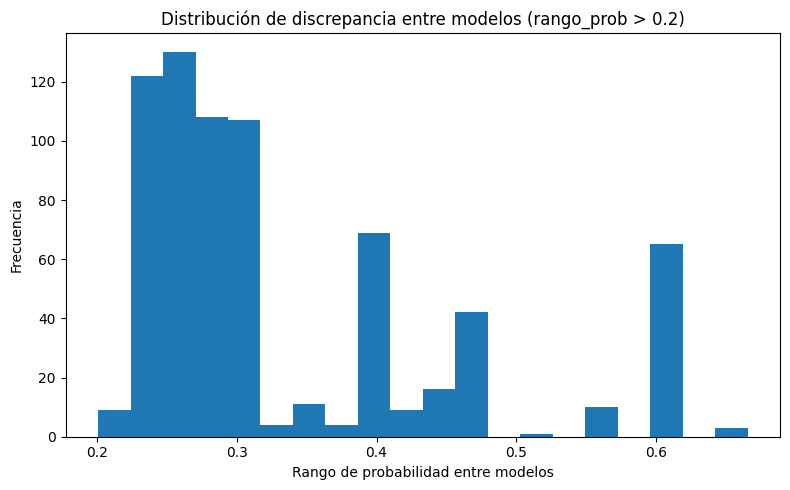

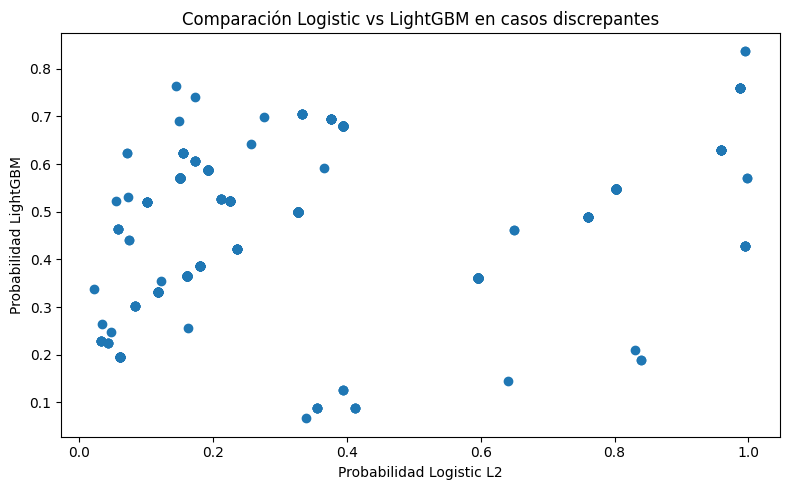

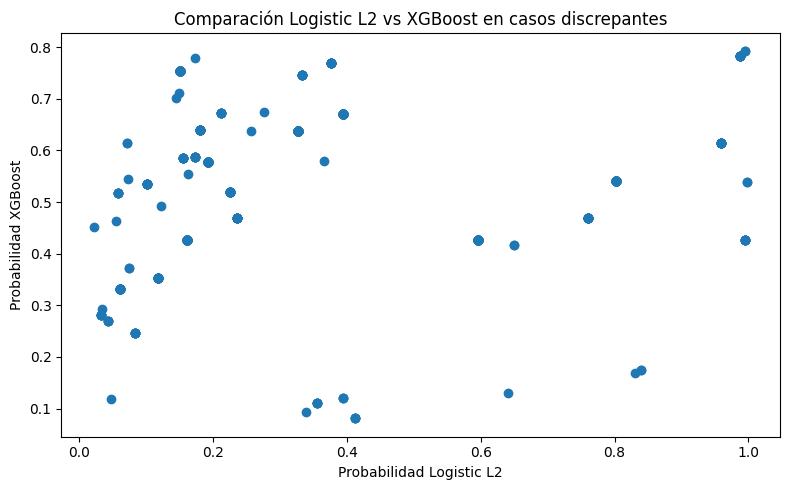

In [40]:
# Prob columns
prob_cols = [
    "prob_secure_lightgbm",
    "prob_secure_xgboost",
    "prob_secure_logistic_l2",
]

# Segmentos 0 y 1 (crear si no existe)
n = len(df)
third = n // 3
df['segmento_origen'] = 0
df.loc[third: third*2 - 1, 'segmento_origen'] = 1
df.loc[third*2:, 'segmento_origen'] = 2

df_01 = df[df["segmento_origen"].isin([0, 1])].copy()

# Calcular discrepancia
df_01["max_prob"] = df_01[prob_cols].max(axis=1)
df_01["min_prob"] = df_01[prob_cols].min(axis=1)
df_01["rango_prob"] = df_01["max_prob"] - df_01["min_prob"]

# Filtrar casos discrepantes
umbral_diferencia = 0.2
df_discrep = df_01[df_01["rango_prob"] > umbral_diferencia]

# Gráfico 1: Histograma
plt.figure(figsize=(8,5))
plt.hist(df_discrep["rango_prob"], bins=20)
plt.title("Distribución de discrepancia entre modelos (rango_prob > 0.2)")
plt.xlabel("Rango de probabilidad entre modelos")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

# Gráfico 2: Scatter Logistic vs LightGBM
plt.figure(figsize=(8,5))
plt.scatter(df_discrep["prob_secure_logistic_l2"], df_discrep["prob_secure_lightgbm"])
plt.title("Comparación Logistic vs LightGBM en casos discrepantes")
plt.xlabel("Probabilidad Logistic L2")
plt.ylabel("Probabilidad LightGBM")
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 5))
plt.scatter(
    df_discrep["prob_secure_logistic_l2"],
    df_discrep["prob_secure_xgboost"]
)
plt.title("Comparación Logistic L2 vs XGBoost en casos discrepantes")
plt.xlabel("Probabilidad Logistic L2")
plt.ylabel("Probabilidad XGBoost")
plt.tight_layout()
plt.show()


In [41]:
cols = ["segmento_origen", "password", "masked", "rango_prob"] + prob_cols
df_discrep_muestra = df_discrep.sort_values("rango_prob", ascending=False)[cols].head(30)

df_discrep_muestra.reset_index(drop=True)


,segmento_origen,password,masked,rango_prob,prob_secure_lightgbm,prob_secure_xgboost,prob_secure_logistic_l2
0,0,fernanda121212,fe************,0.665726,0.189086,0.174393,0.840119
1,0,cristina121212,cr************,0.665726,0.189086,0.174393,0.840119
2,0,fernanda112233,fe************,0.661129,0.209009,0.168697,0.829826
3,1,Roberto2012!,Ro**********,0.618705,0.762848,0.701719,0.144143
4,1,camila_876!,ca*********,0.606994,0.741503,0.779543,0.172550
5,1,Pedro2022!,Pe********,0.603452,0.571478,0.754361,0.150909
6,1,Luisa2008?,Lu********,0.603452,0.571478,0.754361,0.150909
7,1,Luisa2004*,Lu********,0.603452,0.571478,0.754361,0.150909
8,1,Diego2003?,Di********,0.603452,0.571478,0.754361,0.150909
9,1,Maria1992*,Ma********,0.603452,0.571478,0.754361,0.150909


In [42]:
# Nos aseguramos de tener los datos de discrepancia
df_01 = df[df["segmento_origen"].isin([0, 1])].copy()

prob_cols = [
    "prob_secure_lightgbm",
    "prob_secure_xgboost",
    "prob_secure_logistic_l2",
]

df_01["max_prob"] = df_01[prob_cols].max(axis=1)
df_01["min_prob"] = df_01[prob_cols].min(axis=1)
df_01["rango_prob"] = df_01["max_prob"] - df_01["min_prob"]

# Filtrar casos con discrepancia significativa (> 0.20)
df_discrep = df_01[df_01["rango_prob"] > 0.60].copy()

# Tomar 10 ejemplos representativos
ejemplos = df_discrep.sort_values("rango_prob", ascending=False).head(10)

display(
    ejemplos[["password", "rango_prob"] + prob_cols]
)


,password,rango_prob,prob_secure_lightgbm,prob_secure_xgboost,prob_secure_logistic_l2
786,cristina121212,0.665726,0.189086,0.174393,0.840119
3226,fernanda121212,0.665726,0.189086,0.174393,0.840119
2535,fernanda112233,0.661129,0.209009,0.168697,0.829826
4827,Roberto2012!,0.618705,0.762848,0.701719,0.144143
3582,camila_876!,0.606994,0.741503,0.779543,0.172550
3342,Pedro1995?,0.603452,0.571478,0.754361,0.150909
3600,Maria1992*,0.603452,0.571478,0.754361,0.150909
3512,Sofia1993!,0.603452,0.571478,0.754361,0.150909
3704,Paula1996*,0.603452,0.571478,0.754361,0.150909
3736,Diego1994?,0.603452,0.571478,0.754361,0.150909


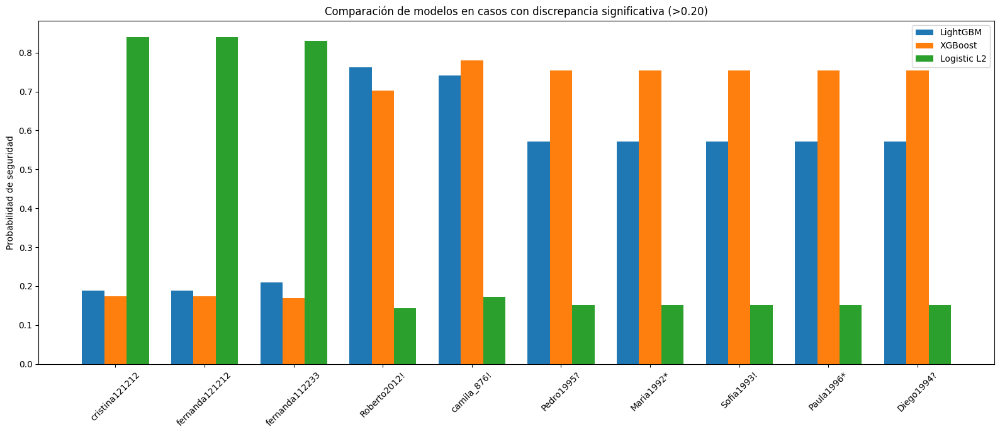

In [43]:
import numpy as np
import matplotlib.pyplot as plt

ej = ejemplos.copy()

# Preparar datos
labels = ej["password"].tolist()
x = np.arange(len(labels))  # número de ejemplos

light = ej["prob_secure_lightgbm"].values
xgb   = ej["prob_secure_xgboost"].values
log   = ej["prob_secure_logistic_l2"].values

width = 0.25  # separación entre barras

plt.figure(figsize=(16, 7))
plt.bar(x - width, light, width, label='LightGBM')
plt.bar(x,       xgb,   width, label='XGBoost')
plt.bar(x + width, log, width, label='Logistic L2')

plt.xticks(x, labels, rotation=45)
plt.ylabel("Probabilidad de seguridad")
plt.title("Comparación de modelos en casos con discrepancia significativa (>0.20)")
plt.legend()
plt.tight_layout()
plt.show()


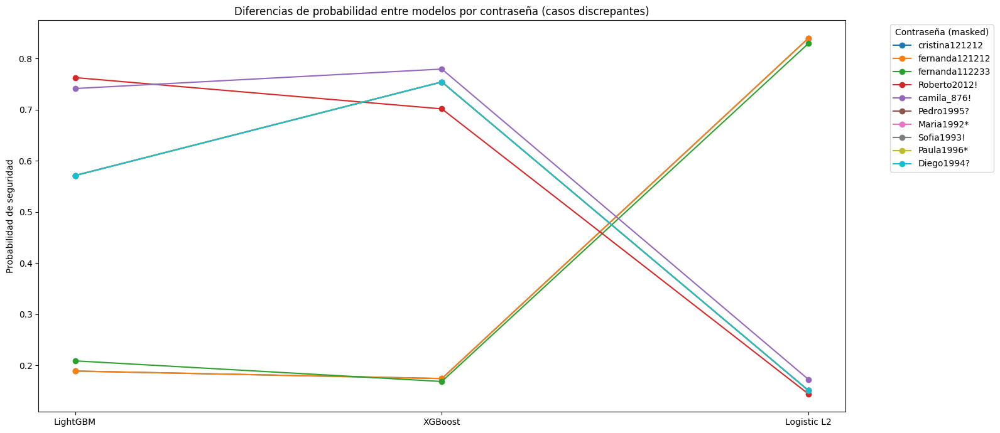

In [44]:
plt.figure(figsize=(16, 7))

for idx, row in ej.iterrows():
    plt.plot(
        ["LightGBM", "XGBoost", "Logistic L2"],
        [row["prob_secure_lightgbm"], row["prob_secure_xgboost"], row["prob_secure_logistic_l2"]],
        marker='o',
        label=row["password"]
    )

plt.title("Diferencias de probabilidad entre modelos por contraseña (casos discrepantes)")
plt.ylabel("Probabilidad de seguridad")
plt.legend(title="Contraseña (masked)", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [45]:
import pandas as pd

# Consideramos solo segmentos 0 y 1
df_01 = df[df["segmento_origen"].isin([0, 1])].copy()

# Calcular discrepancia entre modelos
df_01["max_prob"] = df_01[prob_cols].max(axis=1)
df_01["min_prob"] = df_01[prob_cols].min(axis=1)
df_01["rango_prob"] = df_01["max_prob"] - df_01["min_prob"]

# Elegir cuántas contraseñas "polémicas" quieres analizar
n_polemicas = 100  # puedes cambiar esto a 10, 20, etc.

contraseñas_polemicas = df_01.sort_values(
    by="rango_prob", ascending=False
).head(n_polemicas)

cols_mostrar = ["segmento_origen", "password", "masked", "rango_prob"] + prob_cols
display(contraseñas_polemicas[cols_mostrar].reset_index(drop=True))


,segmento_origen,password,masked,rango_prob,prob_secure_lightgbm,prob_secure_xgboost,prob_secure_logistic_l2
0,0,fernanda121212,fe************,0.665726,0.189086,0.174393,0.840119
1,0,cristina121212,cr************,0.665726,0.189086,0.174393,0.840119
2,0,fernanda112233,fe************,0.661129,0.209009,0.168697,0.829826
3,1,Roberto2012!,Ro**********,0.618705,0.762848,0.701719,0.144143
4,1,camila_876!,ca*********,0.606994,0.741503,0.779543,0.172550
5,1,Luisa1995*,Lu********,0.603452,0.571478,0.754361,0.150909
6,1,Diego1995?,Di********,0.603452,0.571478,0.754361,0.150909
7,1,Paula2009!,Pa********,0.603452,0.571478,0.754361,0.150909
8,1,Pedro1996*,Pe********,0.603452,0.571478,0.754361,0.150909
9,1,Diego2009!,Di********,0.603452,0.571478,0.754361,0.150909


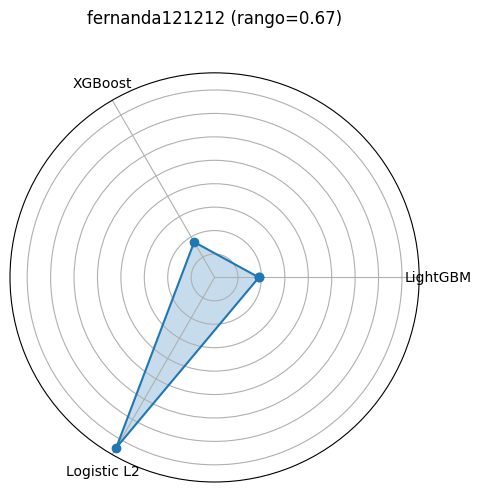

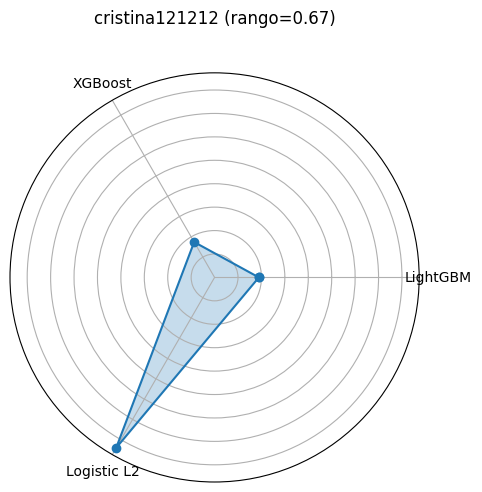

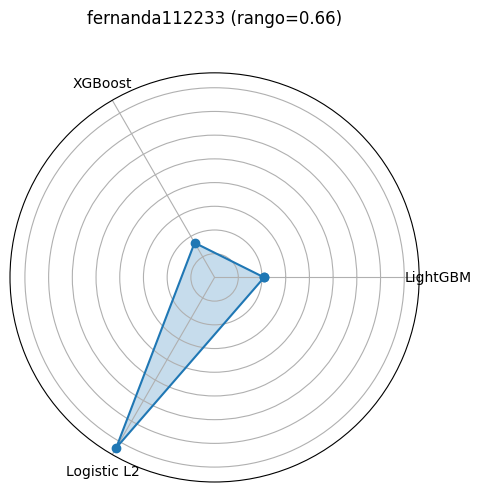

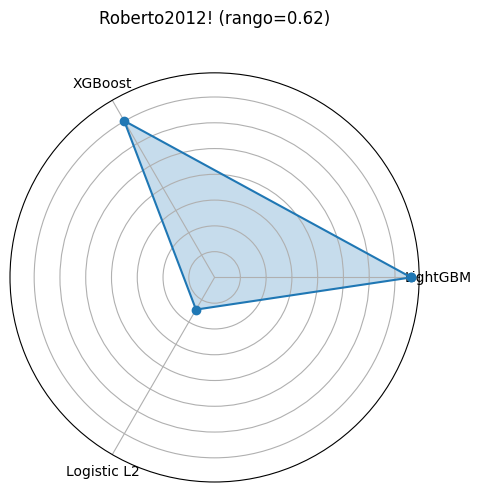

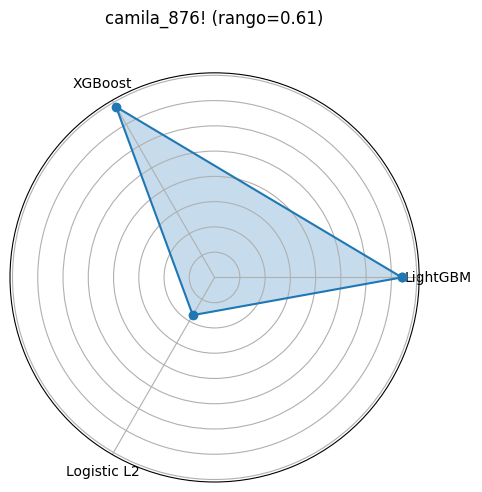

...

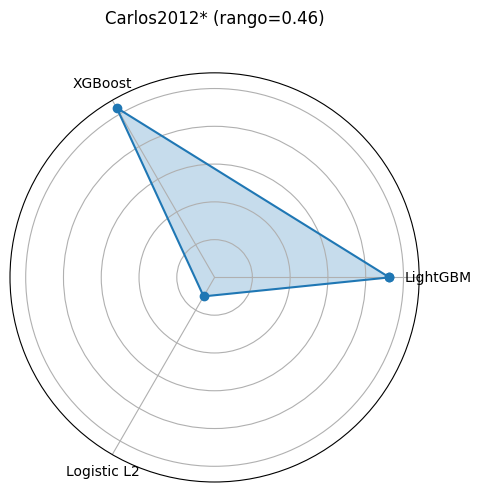

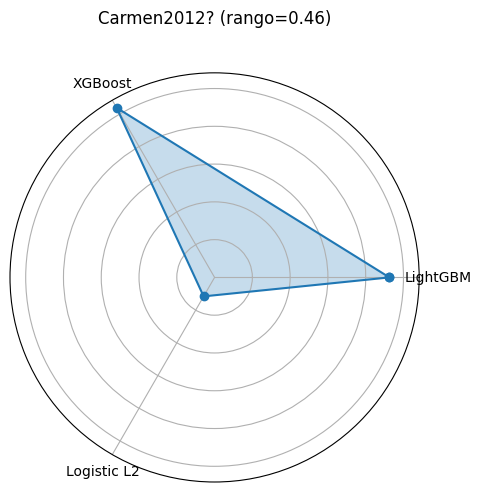

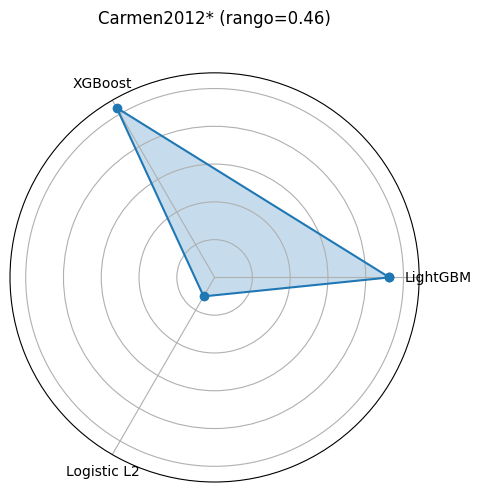

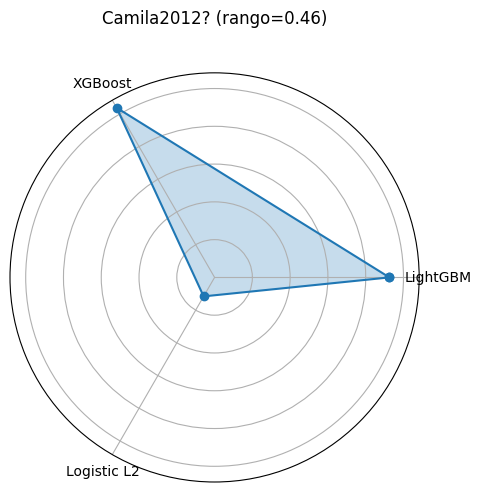

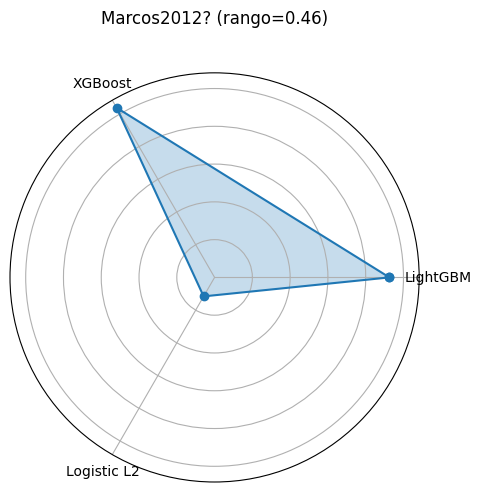

In [46]:
labels_modelos = ["LightGBM", "XGBoost", "Logistic L2"]
num_vars = len(labels_modelos)

angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False)
angles = np.concatenate((angles, [angles[0]]))

ej = contraseñas_polemicas.copy()

for _, row in ej.iterrows():
    valores = [
        row["prob_secure_lightgbm"],
        row["prob_secure_xgboost"],
        row["prob_secure_logistic_l2"],
    ]
    valores = np.concatenate((valores, [valores[0]]))

    plt.figure(figsize=(5, 5))
    ax = plt.subplot(1, 1, 1, projection="polar")
    ax.plot(angles, valores, marker="o")
    ax.fill(angles, valores, alpha=0.25)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels_modelos)
    ax.set_yticklabels([])

    titulo = f"{row['password']} (rango={row['rango_prob']:.2f})"
    ax.set_title(titulo, y=1.1)

    plt.tight_layout()
    plt.show()


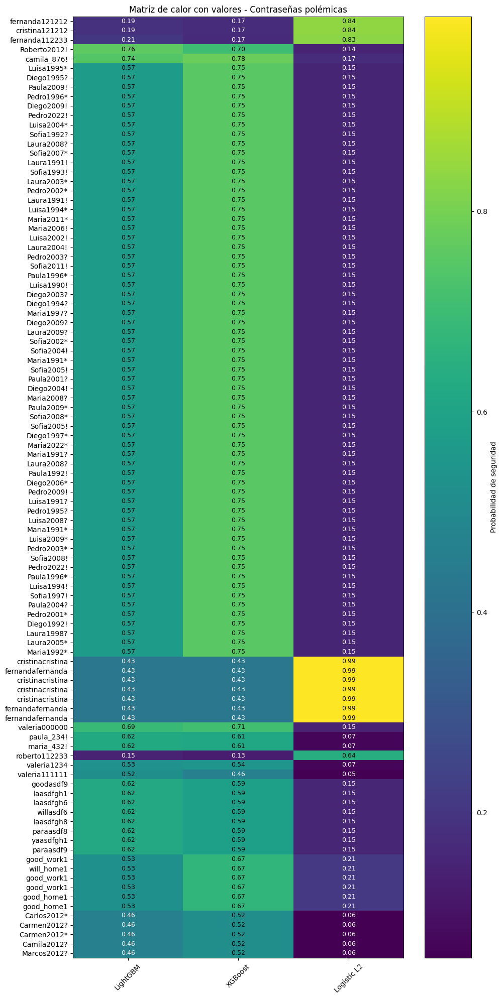

In [47]:
import numpy as np
import matplotlib.pyplot as plt

# Usamos las mismas contraseñas polémicas seleccionadas antes
ej = contraseñas_polemicas.copy()

# Matriz de probabilidades (filas = contraseñas, columnas = modelos)
matriz = ej[prob_cols].values

# Etiquetas de filas y columnas
etiquetas_filas = ej["password"].tolist()
etiquetas_columnas = ["LightGBM", "XGBoost", "Logistic L2"]

plt.figure(figsize=(10, 20))

# Dibujar el mapa de calor
plt.imshow(matriz, aspect="auto")

# Barra de colores
plt.colorbar(label="Probabilidad de seguridad")

# Etiquetas
plt.xticks(np.arange(len(etiquetas_columnas)), etiquetas_columnas, rotation=45)
plt.yticks(np.arange(len(etiquetas_filas)), etiquetas_filas)

plt.title("Matriz de calor con valores - Contraseñas polémicas")
plt.tight_layout()

# --- AGREGAR LOS VALORES NUMÉRICOS DENTRO DE CADA CELDA ---
for i in range(len(etiquetas_filas)):           # filas
    for j in range(len(etiquetas_columnas)):    # columnas
        valor = matriz[i, j]
        
        # Elegimos color del texto según el contraste
        color = "white" if valor < 0.5 else "black"
        
        plt.text(j, i, f"{valor:.2f}", ha="center", va="center", color=color, fontsize=9)

plt.show()


Seccion 3

In [48]:
import pandas as pd

# Filtrar sección 3: tercer tercio (contraseñas seguras)
seg_3 = df[df["segmento_origen"] == 2].copy()

# Resumen por modelo en esta sección
res_seg3 = {}

low_thr = 0.2
high_thr = 0.8

for model in prob_cols:
    probs = seg_3[model]
    res_seg3[model] = {
        "count": len(seg_3),
        "mean_prob": probs.mean(),
        "%_prob<0.2": (probs < low_thr).mean() * 100,
        "%_prob>0.8": (probs > high_thr).mean() * 100,
    }

res_seg3_df = pd.DataFrame(res_seg3).T
res_seg3_df.round(4)


,count,mean_prob,%_prob<0.2,%_prob>0.8
prob_secure_lightgbm,3334.0,0.9997,0.0,99.97
prob_secure_xgboost,3334.0,0.9997,0.0,99.97
prob_secure_logistic_l2,3334.0,0.9954,0.0,100.00


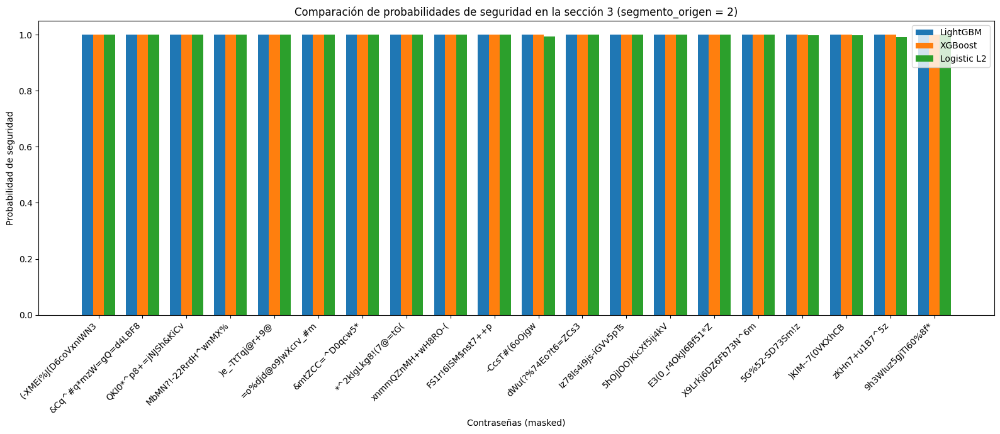

In [49]:
import numpy as np
import matplotlib.pyplot as plt

# Número de contraseñas a mostrar
n_contrasenas = 20  # puedes cambiar a 10, 30, etc.

# Tomamos una muestra de la sección 3
muestra_seg3 = seg_3.sample(n_contrasenas, random_state=42).copy()

# Orden opcional por alguna probabilidad (por ejemplo, LightGBM)
muestra_seg3 = muestra_seg3.sort_values("prob_secure_lightgbm", ascending=False)

# Etiquetas en el eje X: usamos 'masked' para no mostrar la contraseña completa
labels = muestra_seg3["password"].tolist()
x = np.arange(len(labels))  # posiciones en X

light = muestra_seg3["prob_secure_lightgbm"].values
xgb   = muestra_seg3["prob_secure_xgboost"].values
log   = muestra_seg3["prob_secure_logistic_l2"].values

width = 0.25  # ancho de cada barra

plt.figure(figsize=(16, 7))

plt.bar(x - width, light, width, label="LightGBM")
plt.bar(x,         xgb,   width, label="XGBoost")
plt.bar(x + width, log,   width, label="Logistic L2")

plt.xticks(x, labels, rotation=45, ha="right")
plt.ylabel("Probabilidad de seguridad")
plt.xlabel("Contraseñas (masked)")
plt.title("Comparación de probabilidades de seguridad en la sección 3 (segmento_origen = 2)")
plt.legend()
plt.tight_layout()
plt.show()


In [97]:
# Ruta de la carpeta "outputs"
ruta_outputs = Path(r"D:\Universidad\ULTIMO_SEMESTRE\Tesis\Proyecto_PasswordStrength_\outputs")

# Archivo dentro de esa carpeta
ruta_csv = ruta_outputs / "resultados_zxcvbn.csv"


df_zxcvbn = pd.read_csv(ruta_csv)

# porcentaje_seguridad viene en 0–100 → convertir a 0–1
df_zxcvbn["porcentaje_seguridad_norm"] = df_zxcvbn["porcentaje_seguridad"] / 100
df_zxcvbn["score_zxcvbn_norm"] = df_zxcvbn["score_zxcvbn"] / 4


df_zxcvbn.head()



,password,score_zxcvbn,porcentaje_seguridad,crack_time_offline_fast_hash,crack_time_online_slow,porcentaje_seguridad_norm,score_zxcvbn_norm
0,would21,1,25.0,less than a second,6 days,0.25,0.25
1,would2020,1,25.0,less than a second,13 days,0.25,0.25
2,luisaluisa,1,25.0,less than a second,13 hours,0.25,0.25
3,time78,1,25.0,less than a second,6 days,0.25,0.25
4,about123,1,25.0,less than a second,6 days,0.25,0.25


In [98]:
cols_zxcvbn = [
    "password",
    "score_zxcvbn_norm",
    "porcentaje_seguridad_norm",
    "crack_time_offline_fast_hash",
    "crack_time_online_slow",
]

df_z = df_zxcvbn[cols_zxcvbn].copy()

df_merged = df.merge(df_z, on="password", how="inner")

print("Tamaño df original:", df.shape)
print("Tamaño df zxcvbn:", df_z.shape)
print("Tamaño combinado:", df_merged.shape)

df_merged.head()


Tamaño df original: (10000, 41)
Tamaño df zxcvbn: (10000, 5)
Tamaño combinado: (50912, 45)


,password,masked,length,charset_size,shannon_bits_per_char,shannon_total_bits,combinatorial_bits,crack_online_throttled_comb,crack_online_throttled_shan,crack_offline_cpu_comb,crack_offline_cpu_shan,crack_offline_gpu_comb,crack_offline_gpu_shan,crack_custom_comb,crack_custom_shan,prob_secure_lightgbm,prob_secure_xgboost,prob_secure_logistic_l2,feat__charset_size,feat__has_year,feat__length,feat__num_symbols,feat__has_common,feat__num_upper,feat___ends_digit_run6,feat___starts_digit_run6,feat___has_year4,feat__has_repeat,feat__num_digits,feat___max_same_char_run,feat___date_at_end,feat___has_date6,feat__has_seq_num,feat__num_lower,feat___has_date8,feat___has_word_year2,feat___ends_inc_seq4,feat___has_long_repeats,feat___is_email_strict,segmento_origen,segmento_label,score_zxcvbn_norm,porcentaje_seguridad_norm,crack_time_offline_fast_hash,crack_time_online_slow
0,would21,wo*****,7,36,2.807355,19.651484,36.189475,24.83 years,2.29 h,90.70 d,1.4 min,13.1 min,0.008 s,13.1 min,0.008 s,0.000003,0.000004,0.001873,36,1,7,0,1,0,0,0,0,0,2,1,0,0,0,5,0,1,0,0,0,0,primer_tercio,0.25,0.25,less than a second,6 days
1,would2020,wo*******,9,36,2.725481,24.529325,46.529325,3.22e+04 years,2.80 d,321.82 years,40.4 min,11.75 d,0.242 s,11.75 d,0.242 s,0.005874,0.004015,0.018301,36,1,9,0,1,0,0,0,1,0,4,1,0,0,0,5,0,0,0,0,0,0,primer_tercio,0.25,0.25,less than a second,13 days
2,would2020,wo*******,9,36,2.725481,24.529325,46.529325,3.22e+04 years,2.80 d,321.82 years,40.4 min,11.75 d,0.242 s,11.75 d,0.242 s,0.005874,0.004015,0.018301,36,1,9,0,1,0,0,0,1,0,4,1,0,0,0,5,0,0,0,0,0,0,primer_tercio,0.25,0.25,less than a second,13 days
3,would2020,wo*******,9,36,2.725481,24.529325,46.529325,3.22e+04 years,2.80 d,321.82 years,40.4 min,11.75 d,0.242 s,11.75 d,0.242 s,0.005874,0.004015,0.018301,36,1,9,0,1,0,0,0,1,0,4,1,0,0,0,5,0,0,0,0,0,0,primer_tercio,0.25,0.25,less than a second,13 days
4,luisaluisa,lu********,10,26,2.321928,23.219281,47.004397,4.47e+04 years,1.13 d,447.33 years,16.3 min,16.34 d,0.098 s,16.34 d,0.098 s,0.080288,0.060183,0.017462,26,0,10,0,0,0,0,0,0,0,0,1,0,0,0,10,0,0,0,1,0,0,primer_tercio,0.25,0.25,less than a second,13 hours


In [99]:
cols_zxcvbn = [
    "password",
    "score_zxcvbn_norm",
    "porcentaje_seguridad_norm",
    "crack_time_offline_fast_hash",
    "crack_time_online_slow",
]

df_z = df_zxcvbn[cols_zxcvbn].copy()

df_merged = df.merge(df_z, on="password", how="inner")

print("Tamaño df original:", df.shape)
print("Tamaño df zxcvbn:", df_z.shape)
print("Tamaño combinado:", df_merged.shape)

df_merged.head()


Tamaño df original: (10000, 41)
Tamaño df zxcvbn: (10000, 5)
Tamaño combinado: (50912, 45)


,password,masked,length,charset_size,shannon_bits_per_char,shannon_total_bits,combinatorial_bits,crack_online_throttled_comb,crack_online_throttled_shan,crack_offline_cpu_comb,...,feat___has_word_year2,feat___ends_inc_seq4,feat___has_long_repeats,feat___is_email_strict,segmento_origen,segmento_label,score_zxcvbn_norm,porcentaje_seguridad_norm,crack_time_offline_fast_hash,crack_time_online_slow
0,would21,wo*****,7,36,2.807355,19.651484,36.189475,24.83 years,2.29 h,90.70 d,...,1,0,0,0,0,primer_tercio,0.25,0.25,less than a second,6 days
1,would2020,wo*******,9,36,2.725481,24.529325,46.529325,3.22e+04 years,2.80 d,321.82 years,...,0,0,0,0,0,primer_tercio,0.25,0.25,less than a second,13 days
2,would2020,wo*******,9,36,2.725481,24.529325,46.529325,3.22e+04 years,2.80 d,321.82 years,...,0,0,0,0,0,primer_tercio,0.25,0.25,less than a second,13 days
3,would2020,wo*******,9,36,2.725481,24.529325,46.529325,3.22e+04 years,2.80 d,321.82 years,...,0,0,0,0,0,primer_tercio,0.25,0.25,less than a second,13 days
4,luisaluisa,lu********,10,26,2.321928,23.219281,47.004397,4.47e+04 years,1.13 d,447.33 years,...,0,0,1,0,0,primer_tercio,0.25,0.25,less than a second,13 hours


In [104]:
segment_labels = {
    0: "primer_tercio",
    1: "segundo_tercio",
    2: "tercer_tercio"
}

df_merged["segmento_label"] = df_merged["segmento_origen"].map(segment_labels)

df_s12 = df_merged[df_merged["segmento_origen"].isin([0, 1, 2])]

cols_media = prob_cols + ["porcentaje_seguridad_norm", "score_zxcvbn_norm"]

media_seg12 = df_s12.groupby("segmento_label")[cols_media].mean()

media_seg12.round(4)


,prob_secure_lightgbm,prob_secure_xgboost,prob_secure_logistic_l2,porcentaje_seguridad_norm,score_zxcvbn_norm
segmento_label,,,,,
primer_tercio,0.0029,0.0029,0.0120,0.0255,0.0255
segundo_tercio,0.3186,0.3316,0.2905,0.5435,0.5435
tercer_tercio,0.9997,0.9997,0.9954,1.0000,1.0000


<Figure size 1000x600 with 0 Axes>

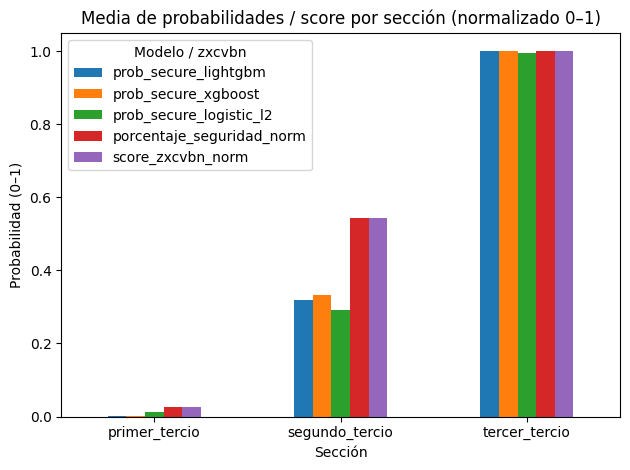

In [105]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

media_seg12.plot(kind="bar")
plt.title("Media de probabilidades / score por sección (normalizado 0–1)")
plt.ylabel("Probabilidad (0–1)")
plt.xlabel("Sección")
plt.xticks(rotation=0)
plt.legend(title="Modelo / zxcvbn")
plt.tight_layout()
plt.show()


Contraseñas discrepantes con zxcvbn disponibles: 737


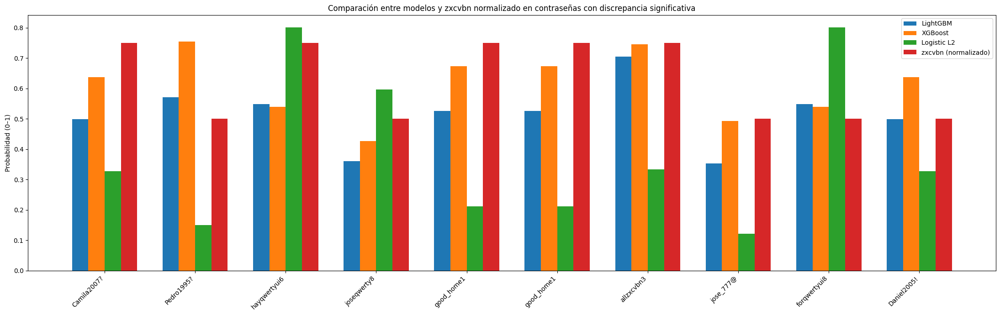

In [ ]:
# porcentaje_seguridad viene en 0–100 → convertir a 0–1
df_zxcvbn["porcentaje_seguridad_norm"] = df_zxcvbn["porcentaje_seguridad"] / 100

# Si deseas convertir el score (0–4) también:
df_zxcvbn["score_zxcvbn_norm"] = df_zxcvbn["score_zxcvbn"] / 4

# -------------------------------
# 1. Filtrar segmentos 1 y 2 (ya en df)
# -------------------------------
prob_cols = [
    "prob_secure_lightgbm",
    "prob_secure_xgboost",
    "prob_secure_logistic_l2",
]

df_12 = df[df["segmento_origen"].isin([1, 2])].copy()

df_12["max_prob"] = df_12[prob_cols].max(axis=1)
df_12["min_prob"] = df_12[prob_cols].min(axis=1)
df_12["rango_prob"] = df_12["max_prob"] - df_12["min_prob"]

umbral = 0.20
df_discrep = df_12[df_12["rango_prob"] > umbral].copy()


# 2. Unir con zxcvbn (normalizado)
cols_zxcvbn = ["password", "porcentaje_seguridad_norm"]
df_zxc = df_zxcvbn[cols_zxcvbn].copy()

df_comp = df_discrep.merge(df_zxc, on="password", how="inner")

print("Contraseñas discrepantes con zxcvbn disponibles:", len(df_comp))


# 3. Preparar datos para el gráfico (primeras N)
N = 10  
df_plot = df_comp.head(N).copy()

labels = df_plot["password"].tolist()
x = np.arange(len(labels))

light = df_plot["prob_secure_lightgbm"].values
xgb   = df_plot["prob_secure_xgboost"].values
log   = df_plot["prob_secure_logistic_l2"].values
zxc   = df_plot["porcentaje_seguridad_norm"].values

width = 0.18

# 4. Gráfico 
plt.figure(figsize=(22, 7))

plt.bar(x - width*1.5, light, width, label="LightGBM")
plt.bar(x - width*0.5, xgb,   width, label="XGBoost")
plt.bar(x + width*0.5, log,   width, label="Logistic L2")
plt.bar(x + width*1.5, zxc,   width, label="zxcvbn ")

plt.xticks(x, labels, rotation=45, ha="right")
plt.ylabel("Probabilidad (0–1)")
plt.title("Comparación entre modelos y zxcvbn normalizado en contraseñas con discrepancia significativa")
plt.legend()
plt.tight_layout()
plt.show()
